<a href="https://colab.research.google.com/github/ankesh86/InteractDiffusionSmallData/blob/main/AnnnotationBBox.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [3]:
from PIL import Image
import requests
import os
from transformers import CLIPProcessor, CLIPModel

model = CLIPModel.from_pretrained("openai/clip-vit-base-patch32")
processor = CLIPProcessor.from_pretrained("openai/clip-vit-base-patch32")

In [6]:
# List of local image file paths
image_paths = [
    'images/HICO_test2015_00000001.jpg',
    'images/HICO_test2015_00000002.jpg',
    'images/HICO_test2015_00000004.jpg',
    'images/img001.jpg',
    'images/img021.jpg',
    'images/img053.jpg'
]

# Load images into a list
images = []
for path in image_paths:
    if os.path.exists(path):  # Check if the file exists
        images.append(Image.open(path))
    else:
        print(f"Image not found at: {path}")

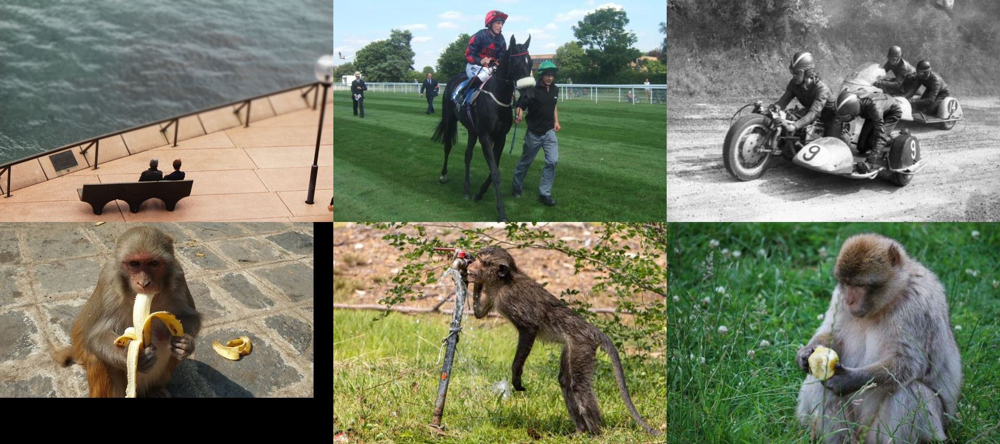

In [7]:
def image_grid(imgs, cols):
    rows = (len(imgs) + cols - 1) // cols
    w, h = imgs[0].size
    grid = Image.new('RGB', size=(cols*w, rows*h))

    for i, img in enumerate(imgs):
        grid.paste(img, box=(i%cols*w, i//cols*h))
    return grid

grid = image_grid(images, cols=3)
display(grid)

In [8]:
from PIL import Image, ImageDraw
# %% Zero-shot classification
classes = ['monkey', 'human', 'bike', 'horse', 'fruit']
inputs = processor(text=classes, images=images, return_tensors="pt", padding=True)

# This function simulates adding bounding boxes to images.
def add_bounding_boxes(image):
    # Simulate bounding box coordinates (x_min, y_min, x_max, y_max)
    boxes = [(50, 50, 200, 200), (100, 100, 250, 250)]  # Example boxes
    draw = ImageDraw.Draw(image)
    for box in boxes:
        draw.rectangle(box, outline="red", width=3)
    return image

# Apply bounding boxes to all images
images_with_boxes = [add_bounding_boxes(img.copy()) for img in images]

outputs = model(**inputs)
logits_per_image = outputs.logits_per_image  # this is the image-text similarity score
probs = logits_per_image.softmax(dim=1)  # we can take the softmax to get the label probabilities

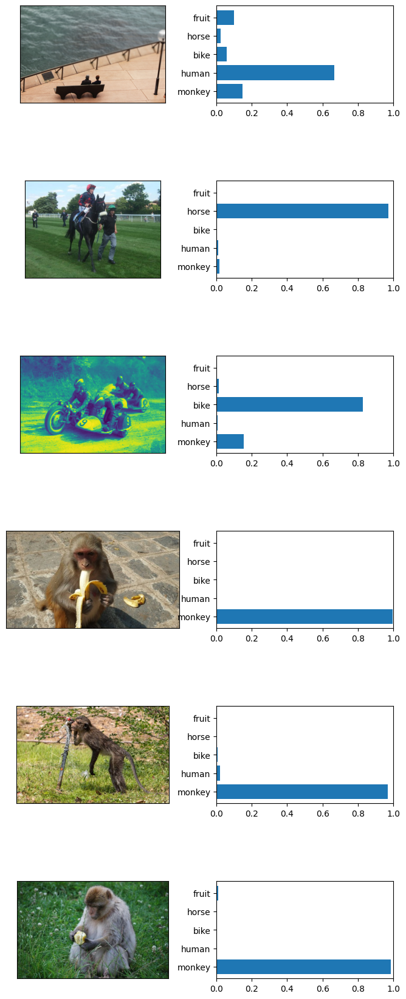

In [9]:
import matplotlib.pyplot as plt

fig = plt.figure(figsize=(8, 20))

for idx in range(len(images)):

    # show original image
    fig.add_subplot(len(images), 2, 2*(idx+1)-1 )
    plt.imshow(images[idx])
    plt.xticks([])
    plt.yticks([])

    # show probabilities
    fig.add_subplot(len(images), 2, 2*(idx+1))
    plt.barh(range(len(probs[0].detach().numpy())),probs[idx].detach().numpy(), tick_label=classes)
    plt.xlim(0,1.0)

    plt.subplots_adjust(left=0.1,
                        bottom=0.1,
                        right=0.9,
                        top=0.9,
                        wspace=0.2,
                        hspace=0.8)

plt.show()

In [11]:
!pip -q install ultralytics opencv-python


0: 448x640 2 persons, 1 bench, 3437.0ms
Speed: 2.4ms preprocess, 3437.0ms inference, 1.4ms postprocess per image at shape (1, 3, 448, 640)


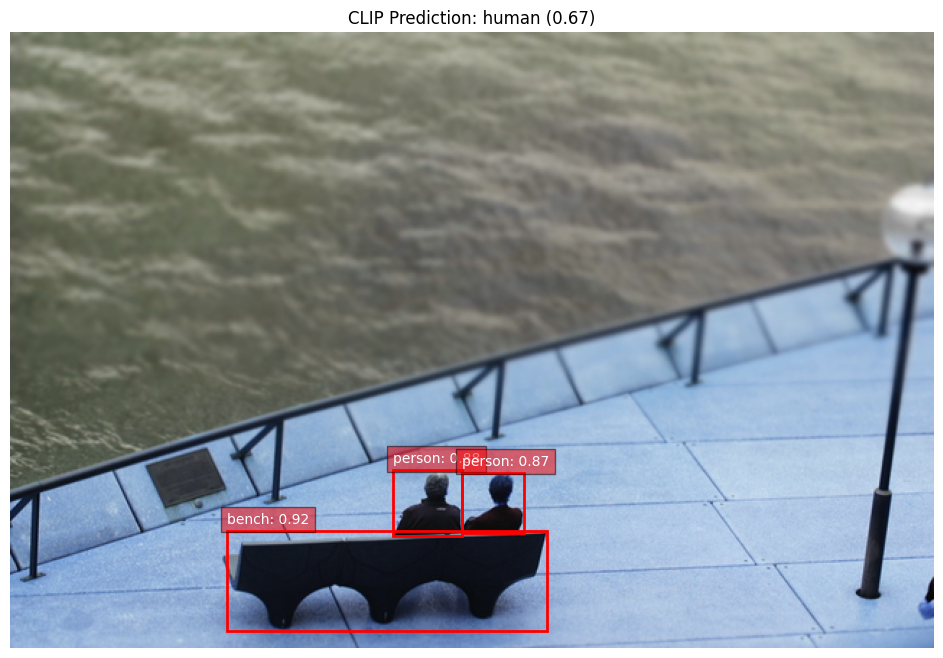


0: 480x640 5 persons, 1 horse, 3435.0ms
Speed: 2.6ms preprocess, 3435.0ms inference, 1.4ms postprocess per image at shape (1, 3, 480, 640)


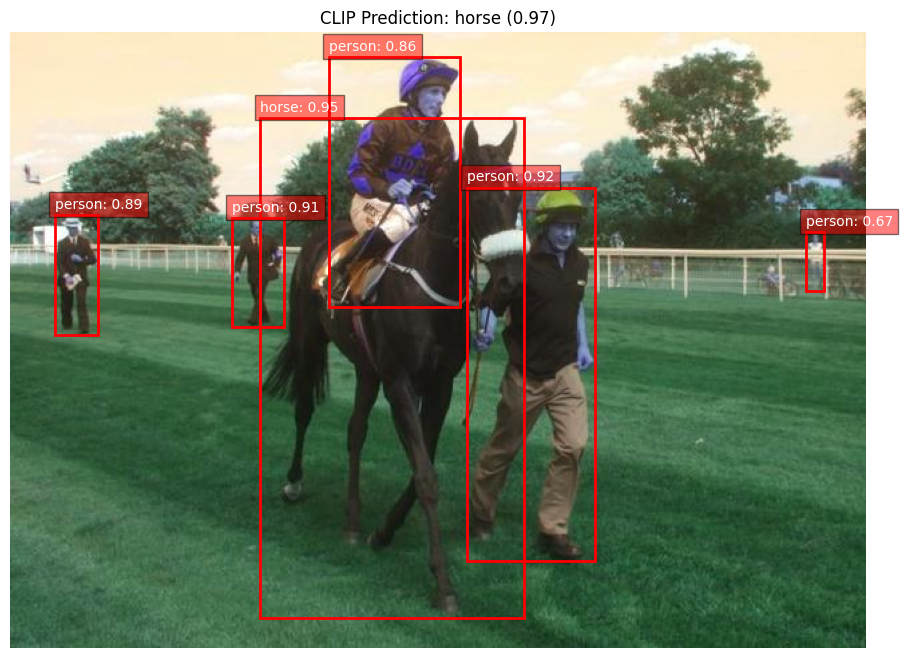


0: 448x640 4 persons, 1 motorcycle, 3781.1ms
Speed: 2.3ms preprocess, 3781.1ms inference, 1.6ms postprocess per image at shape (1, 3, 448, 640)


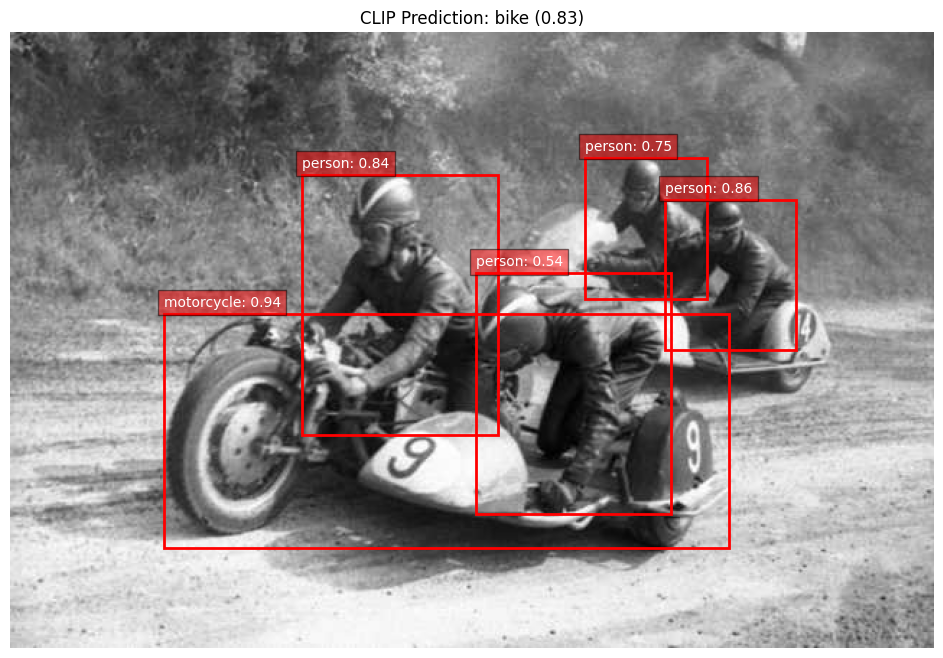


0: 384x640 1 dog, 2 bananas, 3586.6ms
Speed: 7.1ms preprocess, 3586.6ms inference, 1.3ms postprocess per image at shape (1, 3, 384, 640)


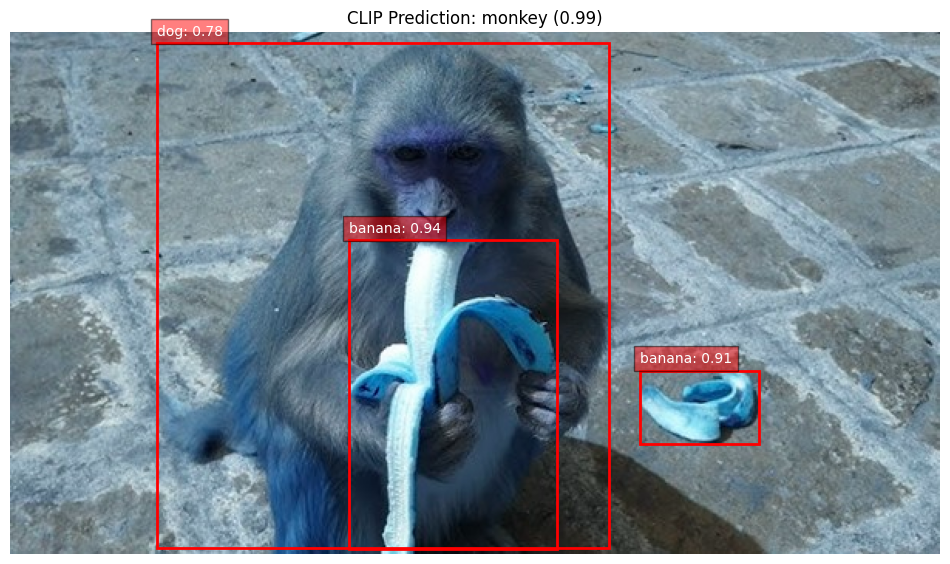


0: 416x640 1 dog, 4136.7ms
Speed: 3.7ms preprocess, 4136.7ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 640)


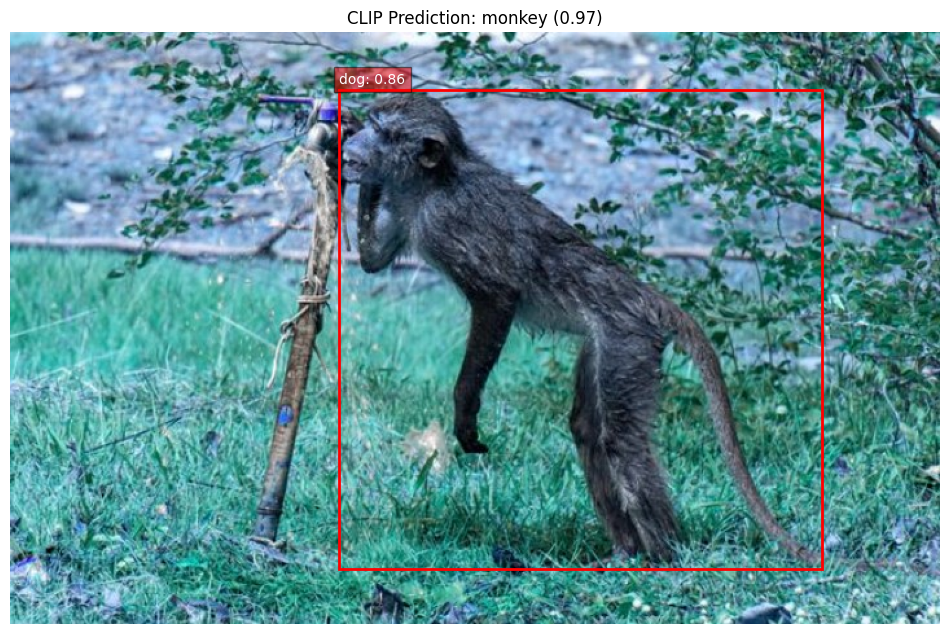


0: 416x640 1 bear, 1 banana, 3392.7ms
Speed: 3.6ms preprocess, 3392.7ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)


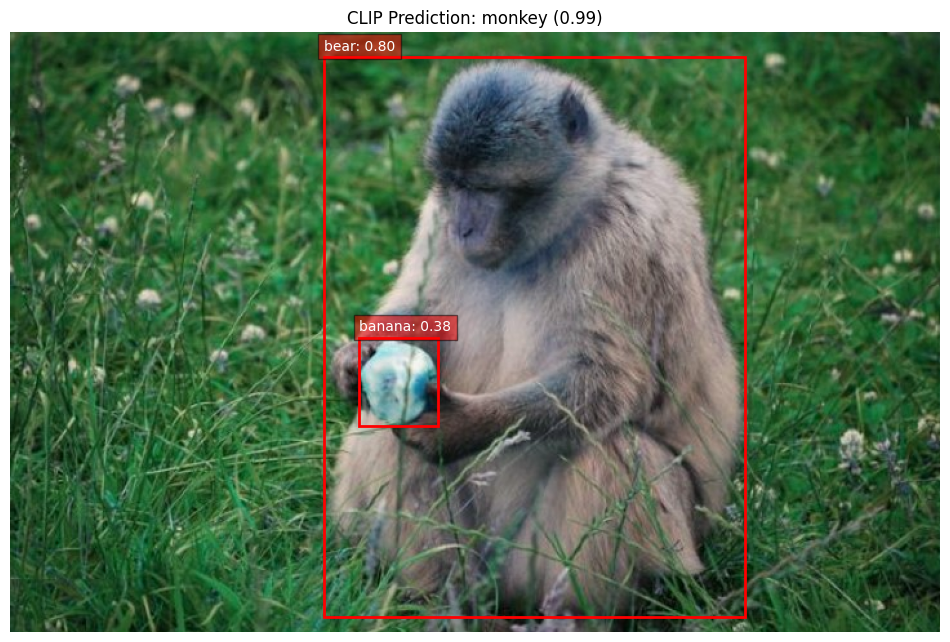

In [15]:
from PIL import Image
import requests
import torch
from transformers import CLIPProcessor, CLIPModel
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from ultralytics import YOLO
import numpy as np
import cv2

# Load YOLOv8 model for object detection
yolo_model = YOLO('yolov8x.pt')
clip_model = CLIPModel.from_pretrained("openai/clip-vit-base-patch32")
clip_processor = CLIPProcessor.from_pretrained("openai/clip-vit-base-patch32")

# CLIP classification classes
clip_classes = ['monkey', 'human', 'bike', 'horse', 'fruit']

# Function to visualize YOLO detections and overlay CLIP results
def visualize_detections(image, yolo_results, clip_probs, classes, conf_threshold=0.3):
    # Convert PIL Image to numpy array
    image_np = np.array(image)
    if image_np.shape[-1] == 4:  # Handle RGBA images
        image_np = cv2.cvtColor(image_np, cv2.COLOR_RGBA2RGB)

    # Get CLIP classification result
    clip_class = classes[clip_probs.argmax()]
    clip_confidence = clip_probs.max().item()

    # Create figure and axes
    fig, ax = plt.subplots(1, figsize=(12, 8))
    ax.imshow(cv2.cvtColor(image_np, cv2.COLOR_RGB2BGR))

    # Draw YOLO detections
    if yolo_results:
        boxes = yolo_results[0].boxes
        for box in boxes:
            # Extract bounding box coordinates and confidence
            x1, y1, x2, y2 = box.xyxy[0].cpu().numpy()
            conf = box.conf[0].cpu().numpy()
            cls = box.cls[0].cpu().numpy()
            class_name = yolo_model.names[int(cls)]

            # Filter detections by confidence and specified classes
            if conf > conf_threshold:
                # Create rectangle
                rect = patches.Rectangle(
                    (x1, y1),
                    x2 - x1,
                    y2 - y1,
                    linewidth=2,
                    edgecolor='red',
                    facecolor='none'
                )
                ax.add_patch(rect)

                # Add label with confidence
                label = f'{class_name}: {conf:.2f}'
                ax.text(
                    x1, y1 - 5,
                    label,
                    fontsize=10,
                    color='white',
                    bbox=dict(facecolor='red', alpha=0.5)
                )

    # Add CLIP classification title
    plt.title(f'CLIP Prediction: {clip_class} ({clip_confidence:.2f})')
    plt.axis('off')
    return fig

# Process images with YOLO and CLIP
clip_inputs = clip_processor(text=clip_classes, images=images, return_tensors="pt", padding=True)
clip_outputs = clip_model(**clip_inputs)
logits_per_image = clip_outputs.logits_per_image
clip_probs = logits_per_image.softmax(dim=1)

# Visualize each image
for idx, image in enumerate(images):
    # YOLO detection
    yolo_results = yolo_model(image)

    # Plot detections and CLIP results
    fig = visualize_detections(
        image,
        yolo_results,
        clip_probs[idx].detach(),
        clip_classes
    )
    plt.show()
    plt.close()



0: 448x640 2 persons, 1 bench, 3689.0ms
Speed: 3.3ms preprocess, 3689.0ms inference, 1.8ms postprocess per image at shape (1, 3, 448, 640)


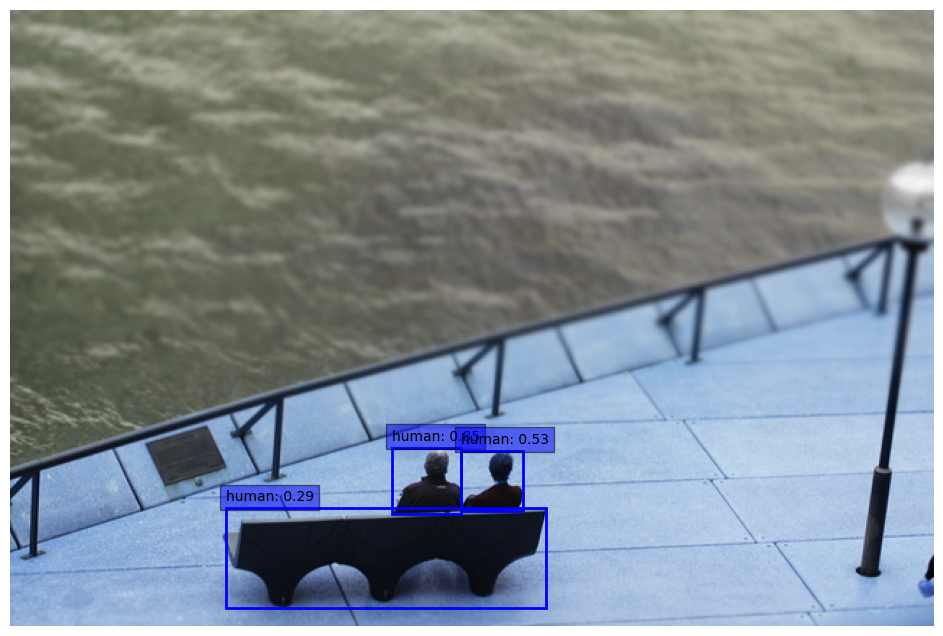


0: 480x640 5 persons, 1 horse, 3560.8ms
Speed: 2.8ms preprocess, 3560.8ms inference, 1.4ms postprocess per image at shape (1, 3, 480, 640)


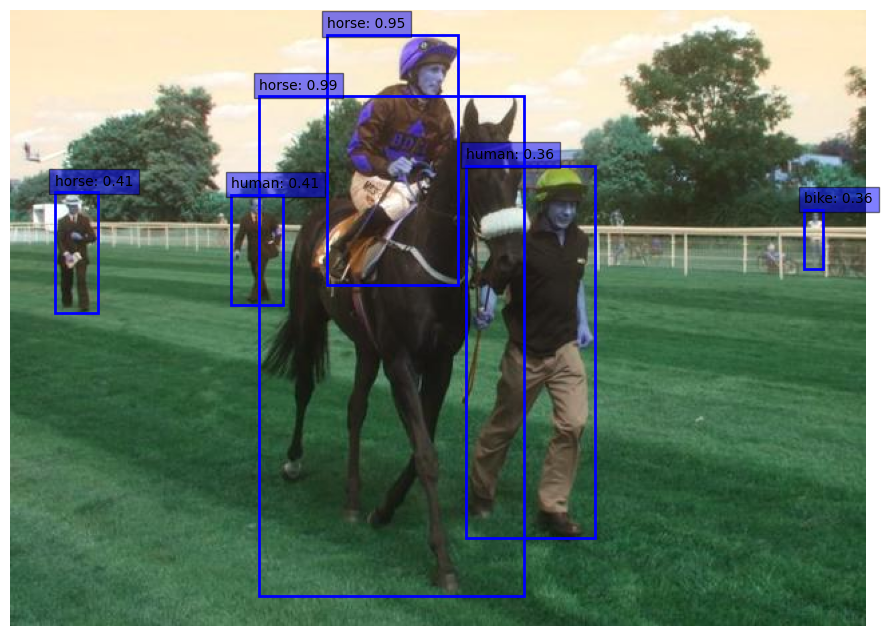


0: 448x640 4 persons, 1 motorcycle, 4831.2ms
Speed: 2.6ms preprocess, 4831.2ms inference, 1.2ms postprocess per image at shape (1, 3, 448, 640)


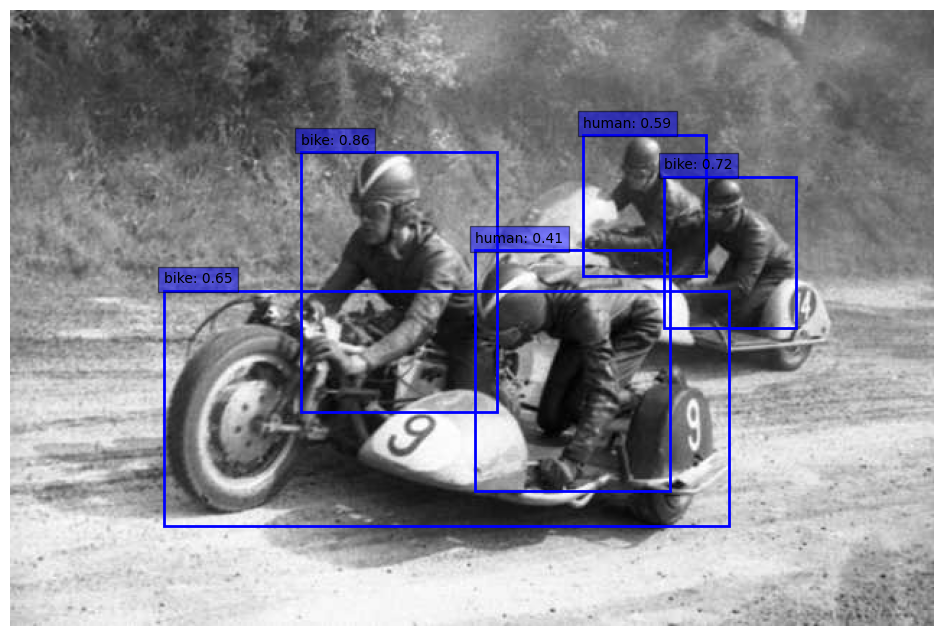


0: 384x640 1 dog, 2 bananas, 2800.8ms
Speed: 4.3ms preprocess, 2800.8ms inference, 1.3ms postprocess per image at shape (1, 3, 384, 640)


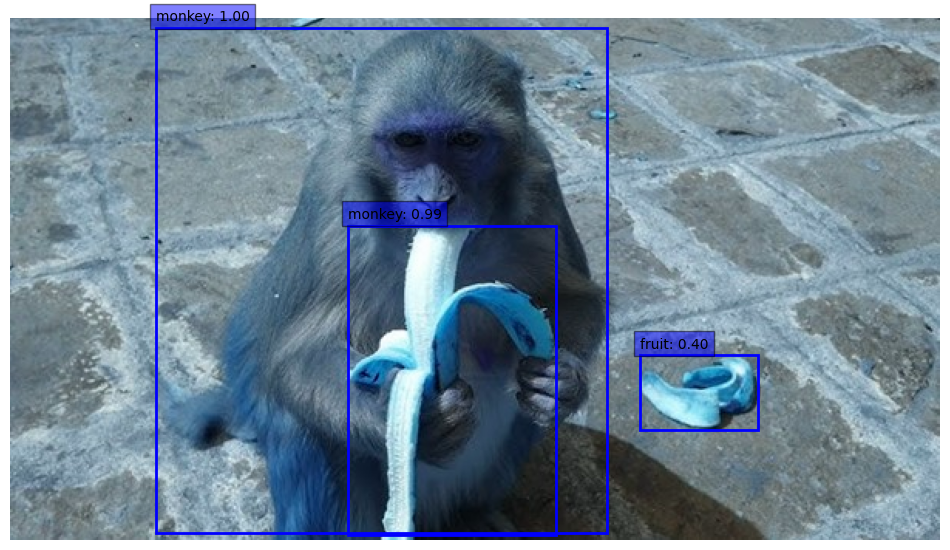


0: 416x640 1 dog, 3042.4ms
Speed: 3.7ms preprocess, 3042.4ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)


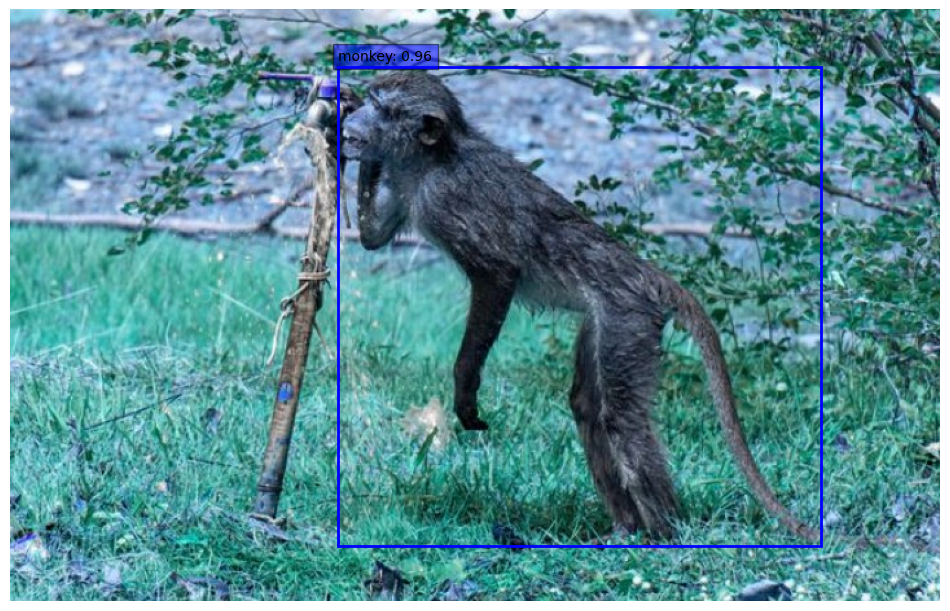


0: 416x640 1 bear, 1 banana, 4814.0ms
Speed: 3.6ms preprocess, 4814.0ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


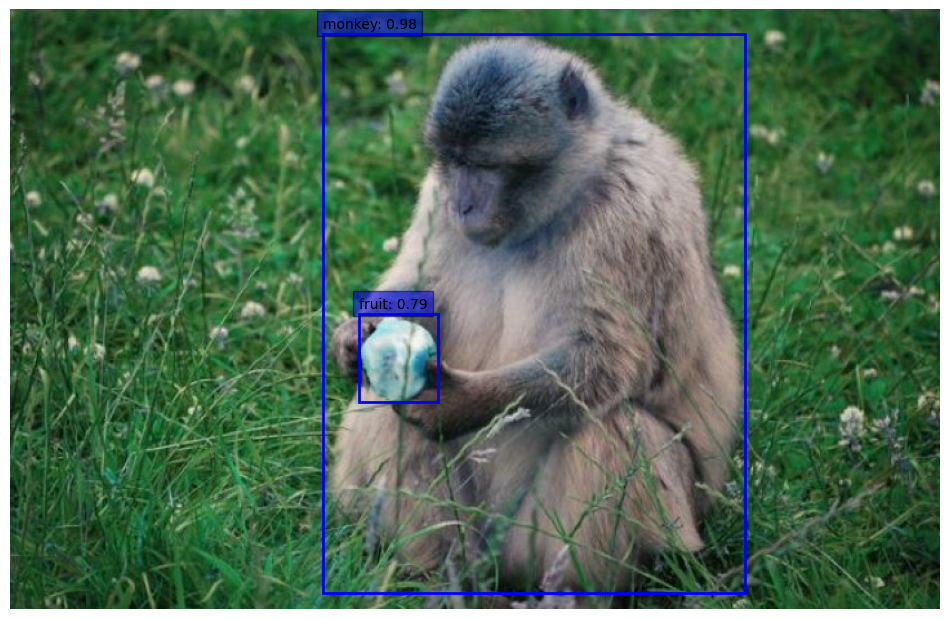

In [16]:
def refine_boxes_with_clip(image, yolo_results, clip_classes, clip_model, clip_processor, conf_threshold=0.3):
    boxes = []
    patches = []

    # Extract bounding boxes and corresponding image patches
    for box in yolo_results[0].boxes:
        x1, y1, x2, y2 = map(int, box.xyxy[0].cpu().numpy())
        conf = box.conf[0].cpu().numpy()
        if conf > conf_threshold:
            boxes.append((x1, y1, x2, y2))
            patches.append(image.crop((x1, y1, x2, y2)))

    # Process patches with CLIP
    if patches:
        clip_inputs = clip_processor(text=clip_classes, images=patches, return_tensors="pt", padding=True)
        clip_outputs = clip_model(**clip_inputs)
        logits_per_image = clip_outputs.logits_per_image
        probs = logits_per_image.softmax(dim=1)

        # Associate CLIP scores with bounding boxes
        refined_boxes = []
        for idx, (box, prob) in enumerate(zip(boxes, probs)):
            clip_class = clip_classes[prob.argmax()]
            clip_confidence = prob.max().item()
            refined_boxes.append({
                'box': box,
                'class': clip_class,
                'confidence': clip_confidence
            })

        return refined_boxes
    return []

# Visualization function modified to include refined CLIP-based bounding boxes
def plot_refined_boxes(image, refined_boxes):
    image_np = np.array(image)
    if image_np.shape[-1] == 4:  # Handle RGBA images
        image_np = cv2.cvtColor(image_np, cv2.COLOR_RGBA2RGB)

    fig, ax = plt.subplots(1, figsize=(12, 8))
    ax.imshow(cv2.cvtColor(image_np, cv2.COLOR_RGB2BGR))

    for box_info in refined_boxes:
        x1, y1, x2, y2 = box_info['box']
        clip_class = box_info['class']
        clip_confidence = box_info['confidence']

        # Draw bounding box
        rect = patches.Rectangle((x1, y1), x2 - x1, y2 - y1, linewidth=2, edgecolor='blue', facecolor='none')
        ax.add_patch(rect)

        # Add label
        label = f'{clip_class}: {clip_confidence:.2f}'
        ax.text(
            x1, y1 - 5,
            label,
            fontsize=10,
            bbox=dict(facecolor='blue', alpha=0.5)
        )

    plt.axis('off')
    plt.show()

# Use YOLO and refine results with CLIP
for idx, image in enumerate(images):
    yolo_results = yolo_model(image)
    refined_boxes = refine_boxes_with_clip(image, yolo_results, clip_classes, clip_model, clip_processor)
    plot_refined_boxes(image, refined_boxes)
